# Haiti Crop Productivity Analysis

## Overview

This notebook analyzes crop productivity trends from 2012 to 2024 using satellite-derived Enhanced Vegetation Index (EVI) data, cropland extent information, and supporting spatial datasets. The analysis focuses on quantifying yearly productive areas, mapping changes in agricultural productivity, and identifying regions where expected plantings did not occur in 2023 and 2024.

## Data

The following datasets are utilized in this analysis for calculating and mapping crop productivity over the past years:

1. **MODIS EVI (Enhanced Vegetation Index) Data**:
   - **Source**: NASA's Moderate Resolution Imaging Spectroradiometer [MODIS](https://modis.gsfc.nasa.gov/data/) on the Terra and Aqua satellites.
   - **Description**: The dataset provides the Enhanced Vegetation Index (EVI), which is an optimized vegetation index designed to improve sensitivity in regions with dense vegetation while minimizing soil background influences.
   - **Spatial Resolution**: 250 meters.
   - **Temporal Coverage**: Data is collected every 16 days. This analysis focuses on yearly aggregated EVI values from 2018 to 2024.
   - **Use Case**: The EVI data is used to identify productive cropland areas by applying thresholds indicative of healthy vegetation.

2. **DEA Cropland Mask**:
   - **Source**: ESA WorldCover - European Space Agency
   - **Description**: The ESA WorldCover dataset is a global land cover map at 10-meter resolution developed by the European Space Agency (ESA). It utilizes Sentinel-1 and Sentinel-2 data along with advanced machine learning algorithms to classify land cover into 11 distinct classes, including cropland, forest, grassland, and built-up areas. The dataset is designed to provide consistent and accurate land cover information across the globe, supporting various environmental and socio-economic applications.
   - **Use Case**This crop mask is used for agricultural monitoring, land use planning, food security assessments, and environmental management. It provides valuable insights into the distribution and extent of cropland, aiding decision-making processes related to sustainable agricultural practices and resource management in Africa.
   
3. **Administrative Boundaries (HDX)**:
   - **Source**: Humanitarian Data Exchange [HDX](https://data.humdata.org/).
   - **Description**: Geographic boundaries used for spatial aggregation and administrative analysis, such as calculating productivity metrics by region (e.g., governorate or district).
   - **Use Case**: The administrative boundaries are used to aggregate EVI statistics by region and facilitate reporting at various administrative levels.

4. **CHIRPS 2.0 (Climate Hazards Group InfraRed Precipitation with Station Data)**:
   - **Source**: The Climate Hazards Center at the University of California, Santa Barbara (UCSB), in collaboration with the U.S. Geological Survey (USGS).
   - **Description**: CHIRPS 2.0 is a high-resolution, long-term precipitation dataset that combines satellite imagery with in-situ station data to provide global rainfall estimates. The dataset is designed for drought monitoring, early warning systems, and climate trend analysis.
   - **Spatial Resolution**: 0.05° (~5.3 km).
   - **Temporal Coverage:** Data is available from 1981 to the present, with daily, pentadal (5-day), and monthly precipitation estimates. This analysis focuses on yearly accumulated precipitation values from 2018 to 2024.

## Methodologies 
### Part 1: Calculating Cropland Area Shares at Admin1 Level and Mapping Crop Area Extents

The first part of the analysis focuses on calculating cropland area shares at the Admin1 level and mapping changes in crop area extent and EVI productivity for the years 2023 and 2024 compared to the average of the past 10 years (2012-2022). The methodology involves the following steps:

1. **Data Preparation and Importing**:
   - Administrative boundary data for Admin1 regions is imported using geopandas, providing a framework for aggregating cropland statistics by region.
   - Remote sensing data, specifically MODIS Enhanced Vegetation Index (EVI), is accessed through Google Earth Engine [GEE](https://earthengine.google.com/). The EVI data serves as a proxy for vegetation health and agricultural productivity.

   - **EVI** : The Enhanced Vegetation Index [EVI](https://modis.gsfc.nasa.gov/data/dataprod/mod13.php) is a satellite-derived measure used to quantify vegetation health and density. It is specifically designed to enhance the monitoring of vegetation by optimizing sensitivity in areas with dense canopy cover and reducing the influence of atmospheric conditions and soil background

2. **Filtering and Masking**:
   - A cropland mask is applied to filter the EVI data to agricultural regions only, ensuring that non-agricultural areas are excluded from the analysis.
   - EVI data for each year from 2012 to 2024 is processed, calculating annual average EVI values to represent productivity metrics over time.

3. **Calculating Cropland Area Shares**:
   - [Zonal statistics](https://pro.arcgis.com/en/pro-app/latest/tool-reference/spatial-analyst/how-zonal-statistics-works.htm#:~:text=A%20zonal%20statistics%20operation%20is,and%20Zonal%20Statistics%20as%20Table.) are employed to aggregate the crop data across specified regions, where the total number of pixels representing cropland is summed up for each Admin1 boundary. The pixel counts are converted into hectares (with each pixel representing 100 square meters) to provide an estimate of the total crop area. 
   - The percentage of cropland relative to the total land area in each region and the share of cropland relative to the entire country's total crop area are calculated to give insights into regional agricultural significance

4. **Mapping EVI Productivity and Changes**:
   - For 2023 and 2024, the difference in EVI values are compared to the 10-year average (2012-2022) during the growing season (in this case, June to November- based on the trend observed in plotting EVI cycles) to assess drop or rise in EVi values and then mapped across states in admin 1.

In [ ]:
import ee
ee.Authenticate()
ee.Initialize()

True

In [3]:
import sys
gee_zonal_module_path = r"D:/WB/GEE_Zonal/src"
sys.path.append(gee_zonal_module_path)

# Now, import the zonal_stats and gee_helpers modules
#import zonalstats
#import gee_helpers
from gee_zonal import *
from gee_zonal import gee_helpers
import geopandas as gpd
import pandas as pd
import numpy as np
import ee
from geemap.conversion import *
import matplotlib.pyplot as plt
import requests
import rasterio
from rasterio.mask import mask
#from gee_helpers import gpd_to_gee
import json
import folium
import branca.colormap as cm
import importlib
import ast
import rasterio
from branca.colormap import LinearColormap
import base64
from io import BytesIO
#import calculate_areas


In [4]:
# loading boundaries 
adm0_path = "C:/Users/Usuario/Downloads/geoBoundaries-HTI-ADM0-all/geoBoundaries-HTI-ADM0.shp"
hti_adm0 = gpd.read_file(adm0_path)
hti_adm0.to_file("haiti_boundary.geojson", driver="GeoJSON")
with open("haiti_boundary.geojson") as f:
    hti_geojson = json.load(f)
haiti_geometry = ee.Geometry(hti_geojson['features'][0]['geometry'])


adm1_path = "C:/Users/Usuario/Downloads/geoBoundaries-HTI-ADM1-all/geoBoundaries-HTI-ADM1.shp"
hti_adm1 = gpd.read_file(adm1_path)
hti_adm1.to_file("haiti_boundary1.geojson", driver="GeoJSON")
with open("haiti_boundary1.geojson") as f:
    hti_geojson_adm1 = json.load(f)
hti_adm1_geometry = ee.Geometry(hti_geojson_adm1['features'][0]['geometry'])

In [7]:
# Extracting centroid values
centroid = haiti_geometry.centroid().coordinates().getInfo()
centy, centx = centroid[1], centroid[0]

In [8]:
#loading boundaries
iso3 = "HTI"
country = "Haiti"
release_type = "gbOpen"

# adm = "ADM0"
# geo_url = f"https://www.geoboundaries.org/api/current/{release_type}/{iso3}/{adm}/"
# res = requests.get(geo_url).json()
# print("Reading " + res["gjDownloadURL"])
# adm0_hti = gpd.read_file(res["gjDownloadURL"])

adm = "ADM1"
geo_url = f"https://www.geoboundaries.org/api/current/{release_type}/{iso3}/{adm}/"
res = requests.get(geo_url).json()
print("Reading " + res["gjDownloadURL"])
adm1_hti = gpd.read_file(res["gjDownloadURL"])

# adm = "ADM2"
# geo_url = f"https://www.geoboundaries.org/api/current/{release_type}/{iso3}/{adm}/"
# res = requests.get(geo_url).json()
# print("Reading " + res["gjDownloadURL"])
# adm2_hti = gpd.read_file(res["gjDownloadURL"])

#adm0_hti.to_file('admo_hti.geojson',driver='GeoJson')
adm1_hti.to_file('adm1_hti.geojson', driver='GeoJSON')
# adm1_ner = gpd.read_file('adm1_ner.geojson')
# adm2_ner.to_file('adm2_ner.geojson', driver='GeoJSON')
# adm2_ner = gpd.read_file('adm2_ner.geojson')

Reading https://github.com/wmgeolab/geoBoundaries/raw/9469f09/releaseData/gbOpen/HTI/ADM1/geoBoundaries-HTI-ADM1.geojson


In [9]:
aoi = gpd_to_gee(adm1_hti)

In [12]:
# MODIS Data for EVI
start_period = ee.Date("2012-01-01")
end_period = ee.Date("2024-12-31")

terra = (
    ee.ImageCollection("MODIS/061/MOD13Q1")
    .select(["EVI", "SummaryQA", "DetailedQA"])
    .filterDate(start_period, end_period)
)
aqua = (
    ee.ImageCollection("MODIS/061/MYD13Q1")
    .select(["EVI", "SummaryQA", "DetailedQA"])
    .filterDate(start_period, end_period)
)

modis = terra.select("EVI").merge(aqua.select("EVI"))
modis = modis.sort("system:time_start")

modis
#----------------------BITWISE MASKING---------------------------------------
def bitwiseExtract(value, fromBit, toBit=None):
    if toBit == None:
        toBit = fromBit
    maskSize = ee.Number(1).add(toBit).subtract(fromBit)
    mask = ee.Number(1).leftShift(maskSize).subtract(1)
    return value.rightShift(fromBit).bitwiseAnd(mask)


# Applying the SummaryQA  and DetailedQA
def modisQA_mask(image):
    sqa = image.select("SummaryQA")
    dqa = image.select("DetailedQA")
    viQualityFlagsS = bitwiseExtract(sqa, 0, 1)
    viQualityFlagsD = bitwiseExtract(dqa, 0, 1)
    # viUsefulnessFlagsD = bitwiseExtract(dqa, 2, 5)
    viSnowIceFlagsD = bitwiseExtract(dqa, 14)
    viShadowFlagsD = bitwiseExtract(dqa, 15)
    # Good data, use with confidence
    mask = (
        viQualityFlagsS.eq(0)
        .And(viQualityFlagsD.eq(0))
        .And(viQualityFlagsS.eq(1))
        .And(viQualityFlagsD.eq(1))
        .And(viSnowIceFlagsD)
        .eq(0)
    )
    # .And(viShadowFlagsD).eq(0); # No shadow
    return image.updateMask(mask)


mod13q1_QC = terra.map(modisQA_mask)
myd13q1_QC = aqua.map(modisQA_mask)

mxd13q1_cleaned = mod13q1_QC.select("EVI").merge(myd13q1_QC.select("EVI"))
mxd13q1_cleaned_sorted = mxd13q1_cleaned.sort("system:time_start")

bool_dict = {
    "0": "ocean",
    "1": "non_crop",
    "2": "crop_irrigated",
    "3": "crop_rainfed",
}

# Applying ESA WorldCover Cropmask
worldcover = ee.Image('ESA/WorldCover/v200/2021')
crop_data_dea = worldcover.eq(40).rename("crop").clip(haiti_geometry)
crop_data_viz_dea = crop_data_dea.mask(crop_data_dea.gt(0))


scale_factor = 0.0001

# apply cropland mask to imageCollection
def cropmask(img):
    return img.updateMask(crop_data_dea).clip(haiti_geometry)  # .multiply(scale_factor) # unmask(-1)


mxd13q1 = mxd13q1_cleaned_sorted.map(cropmask)

In [13]:
bool_dict = {
    "0": "non_crop",
    "1": "crop",
}
zs = ZonalStats(
    target_features=aoi,
    statistic_type="count",
    scale=10,
    ee_dataset=crop_data_dea,
    output_name="adm1_crop_count",
    output_dir="haiti",
)

In [13]:
zs.runZonalStats()

In [14]:
zs.reportRunTime()

Status is Ready, hasn't started


#### Croparea Statistics


In [14]:
adm1_cropcount_path = "C:/Users/Usuario/Downloads/adm1_crop_count.csv"
df = pd.read_csv(adm1_cropcount_path)

def load_dict(input_str):
    input_str = input_str.replace("null", "'null'")
    input_str = input_str.replace("=", ":")
    result_dict = ast.literal_eval(input_str)
    return result_dict


df.loc[:, "histogram"] = df.apply(lambda x: load_dict(x["histogram"]), axis=1)

bool_dict = {
    0: "non_crop",
    1: "crop",
}
histograms = df["histogram"]
histograms_dfs = [
    pd.DataFrame(index=[idx], data=hist_dict) for idx, hist_dict in histograms.items()
]
histogram_df = pd.concat(histograms_dfs, axis=0).fillna(0)
histogram_df.rename(columns=bool_dict, inplace=True)

df = df.join(histogram_df)
df = df.sort_values(by="crop", ascending=False)
df.loc[:, "Crop Area ha."] = ((df["crop"] * 100) / 10000).apply(lambda x: f"{x:,.0f}")
df.loc[:, "Crop Area Share (% of Region)"] = (
    df["crop"] / (df["crop"] + df["non_crop"])
).apply(lambda x: f"{x:.2%}")
df.loc[:, "Crop Area Share (% of Country)"] = (df["crop"] / (df["crop"].sum())).apply(
    lambda x: f"{x:.2%}"
)
df.rename(columns={"shapeName": "Region"}, inplace=True)
df[
    [
        "Region",
        "Crop Area ha.",
        "Crop Area Share (% of Country)",
        "Crop Area Share (% of Region)",
    ]
].reset_index(drop=True)

,Region,Crop Area ha.,Crop Area Share (% of Country),Crop Area Share (% of Region)
0,Artibonite Department,"36,319",52.14%,7.02%
1,Département de l'Ouest,"10,569",15.17%,2.00%
2,Centre Department,"7,554",10.85%,2.05%
3,Sud Department,"5,778",8.30%,2.06%
4,Département du Nord,"4,086",5.87%,1.82%
5,Nord-Est Department,"2,110",3.03%,1.22%
6,Nord-Ouest Department,"1,644",2.36%,0.74%
7,Département du Sud-Est,"1,349",1.94%,0.63%
8,Département des Nippes,219,0.31%,0.17%
9,Département de la Grande-Anse,23,0.03%,0.01%


#### Cropland Extent [DEA Cropmask]

![Cropland Extent](../../docs/images/agriculture/croplandextent_haiti.png)

In [ ]:
# Define visualization parameters for the crop mask
crop_data_viz_params = {
    'min': 1,
    'max': 255,
    'palette': ['529400'] # Set the color for crop areas to green
}

# Create a Folium map centered over Haiti
map_center = [centy, centx]  # Approximate center of Haiti
m = folium.Map(location=map_center, zoom_start=6)

# Ensure there are no Timestamp objects
for col in hti_adm1.columns:
    if pd.api.types.is_datetime64_any_dtype(hti_adm1[col]):
        hti_adm1[col] = hti_adm1[col].astype(str)  # Convert Timestamps to strings

# Add the boundaries to Folium map with transparent fill and blue border
folium.GeoJson(
    hti_adm1, 
    name="adm2 boundaries",
    style_function=lambda x: {
        'fillColor': 'gray',  # Transparent fill
        'color': 'darkgray',  # Blue boundary color
        'weight': 1  # Thickness of boundary lines
    }
).add_to(m)

# Add labels for each adm2 region (district-level or equivalent)
for _, region in hti_adm1.iterrows():
    folium.Marker(
        location=[region.geometry.centroid.y, region.geometry.centroid.x],  # Centroid of the region
        popup=region['shapeName'],  # Column containing adm2 name (adjust if necessary)
        icon=folium.DivIcon(html=f'<div style="font-size: 12px; font-weight: bold; color: brown;">{region["shapeName"]}</div>')
    ).add_to(m)

# Overlay the crop extent from LGRIP30 using TileLayer with Map ID
crop_map_id = crop_data_viz_dea.getMapId(crop_data_viz_params)
folium.TileLayer(
    tiles=crop_map_id['tile_fetcher'].url_format,
    attr='Google Earth Engine',
    name='LGRIP30 Crop Extent',
    overlay=True,
    control=True
).add_to(m)

# Add layer control to the map (to toggle boundaries and crop extent)
folium.LayerControl().add_to(m)

# Save or display the map
m.save("haiti_crop_extent_dea_adm1.html")
m


In [15]:
aoi1 = gpd_to_gee(hti_adm1)

In [16]:
growing_season = ee.Filter.calendarRange(6, 11, 'month')

# Calculate mean EVI for 2012-2022 growing seasons
gs_evi_10yr_avg = mxd13q1.filterDate('2012-01-01', '2022-12-31').filter(growing_season).mean().clip(haiti_geometry)

# Calculate mean EVI for the 2023 growing season
gs_evi_2023 = mxd13q1.filterDate('2023-01-01', '2023-12-31').filter(growing_season).mean().clip(haiti_geometry)

# Calculate mean EVI for the 2024 growing season
gs_evi_2024 = mxd13q1.filterDate('2024-01-01', '2024-12-31').filter(growing_season).mean().clip(haiti_geometry)

# Calculate the difference between 2023 EVI and the 10-year average
evi_diff_2023 = gs_evi_2023.subtract(gs_evi_10yr_avg).rename('EVI_Difference')
evi_diff_2024 = gs_evi_2024.subtract(gs_evi_10yr_avg).rename('EVI_Difference')

#### EVI Change: 2023 and 2024 with reference to previous 10 years

::::{tab-set}
:::{tab-item} 2023
![EVI_change_haiti_2023.png](../../docs/images/agriculture/EVI_change_haiti_2023.png)
:::

:::{tab-item} 2024
![EVI_change_haiti_2024.png](../../docs/images/agriculture/EVI_change_haiti_2024.png)
:::

::::

In [ ]:
# Clip the EVI image to Haiti
evi_image = gs_evi_10yr_avg.select('EVI').clip(haiti_geometry)

# Set up the export task to Google Drive
task = ee.batch.Export.image.toDrive(
    image=evi_image,
    description='haiti_evi_10yr_avg_export',
    folder='GEE_exports', 
    fileNamePrefix='haiti_evi_10yr_avg',
    region=haiti_geometry,
    scale=250,
    maxPixels=1e13,
    fileFormat='GeoTIFF'
)

# Start the export
task.start()

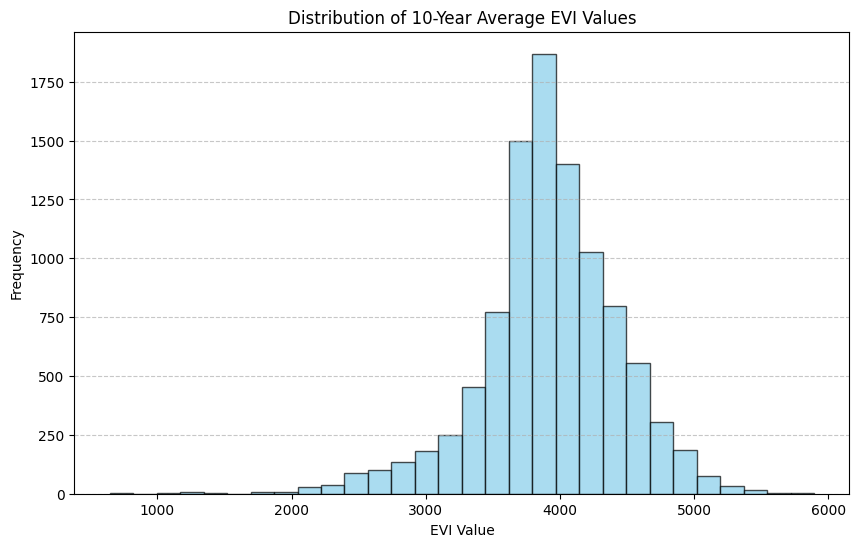

In [17]:
with rasterio.open("C:/Users/Usuario/Downloads/haiti_evi_10yr_avg.tif") as src:  # Read the exported GeoTIFF
    evi_data = src.read(1)

evi_data = evi_data.flatten()

plt.figure(figsize=(10, 6))
plt.hist(evi_data, bins=30, edgecolor='black', color='skyblue', alpha=0.7)
plt.title("Distribution of 10-Year Average EVI Values")
plt.xlabel("EVI Value")
plt.ylabel("Frequency")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [ ]:
# EEException: User memory limit exceeded.


# # Perform the operation
# region_stats = gs_evi_10yr_avg.reduceRegion(
#     reducer=ee.Reducer.toList(),
#     geometry=haiti_geometry,
#     scale=500,  # Use the appropriate scale for your dataset
#     maxPixels=1e8
# )

# # Extract the list of values
# evi_values = region_stats.get('EVI').getInfo() 

# plt.figure(figsize=(10, 6))
# plt.hist(evi_values, bins=30, edgecolor='black', color='skyblue', alpha=0.7)
# plt.title("Distribution of 5-Year Average EVI Values")
# plt.xlabel("EVI Value")
# plt.ylabel("Frequency")
# plt.grid(axis='y', linestyle='--', alpha=0.7)
# plt.show()

In [158]:
# Export the EVI difference image for 2023

evi_diff_2023_clipped = evi_diff_2023.clip(haiti_geometry)

# Set export parameters
export_task = ee.batch.Export.image.toDrive(
    image=evi_diff_2023_clipped,
    description='EVI_diff_2023_export',  
    folder='GEE_exports', 
    fileNamePrefix='haiti_EVI_diff_2023',
    scale=250,  
    region=haiti_geometry, 
    fileFormat='GeoTIFF', 
    maxPixels=1e8 
)

# Start the export task
export_task.start()


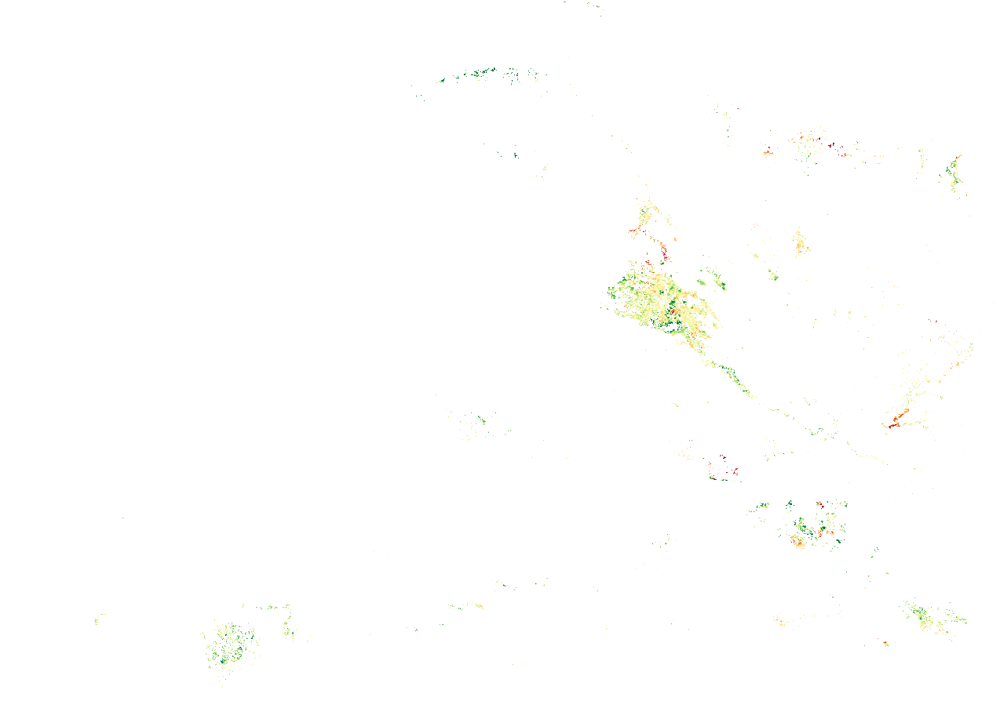

In [64]:
tif_path = "C:/Users/Usuario/Downloads/haiti_EVI_diff_2023.tif"

# Open and read the raster
with rasterio.open(tif_path) as src:
    bounds = src.bounds
    image = src.read(1)
    image = np.ma.masked_equal(image, src.nodata)  # Mask no-data values

    # Normalize for colormap
    norm_img = np.clip((image - (-1000)) / (1000 - (-1000)), 0, 1)

    # Apply red-yellow-green colormap
    colormap = plt.colormaps['RdYlGn']
    rgba_img = colormap(norm_img, bytes=True)  # Shape (H, W, 4)

    # Save image to buffer as PNG
    buf = BytesIO()
    plt.imsave(buf, rgba_img, format='png')
    img_base64 = base64.b64encode(buf.getvalue()).decode('utf-8')

# Create Folium map
fmap = folium.Map(location=[(bounds.top + bounds.bottom) / 2, (bounds.left + bounds.right) / 2], zoom_start=7)

# Add the image as overlay
image_overlay = folium.raster_layers.ImageOverlay(
    image='data:image/png;base64,' + img_base64,
    bounds=[[bounds.bottom, bounds.left], [bounds.top, bounds.right]],
    opacity=0.7,
    name='EVI',
    interactive=True,
    cross_origin=False,
    zindex=1
)
image_overlay.add_to(fmap)

# Add GeoJSON for Haiti
folium.GeoJson(
    hti_adm1,
    style_function=lambda feature: {
        'fillColor': 'gray',
        'color': 'black',
        'weight': 1,
        'dashArray': '5, 5'
    }).add_to(fmap)

# Add colorbar
colorbar = LinearColormap(
    colors=['red', 'yellow', 'green'], 
    vmin=-1000, 
    vmax=1000
).to_step(index=[-1000, -500, 0, 500, 1000])
colorbar.caption = 'EVI Difference (2023) vs (2012–2022)'
colorbar.add_to(fmap)
fmap.save("haiti_evi_difference_2023.html")

fmap


#### EVI Change: 2024 vs (2012-2022)

In [159]:
# Export the EVI difference image for 2024

evi_diff_2024_clipped = evi_diff_2024.clip(haiti_geometry)

# Set export parameters
export_task = ee.batch.Export.image.toDrive(
    image=evi_diff_2024_clipped,
    description='EVI_diff_2024_export',  
    folder='GEE_exports', 
    fileNamePrefix='haiti_EVI_diff_2024',
    scale=250,  
    region=haiti_geometry, 
    fileFormat='GeoTIFF', 
    maxPixels=1e8 
)

# Start the export task
export_task.start()


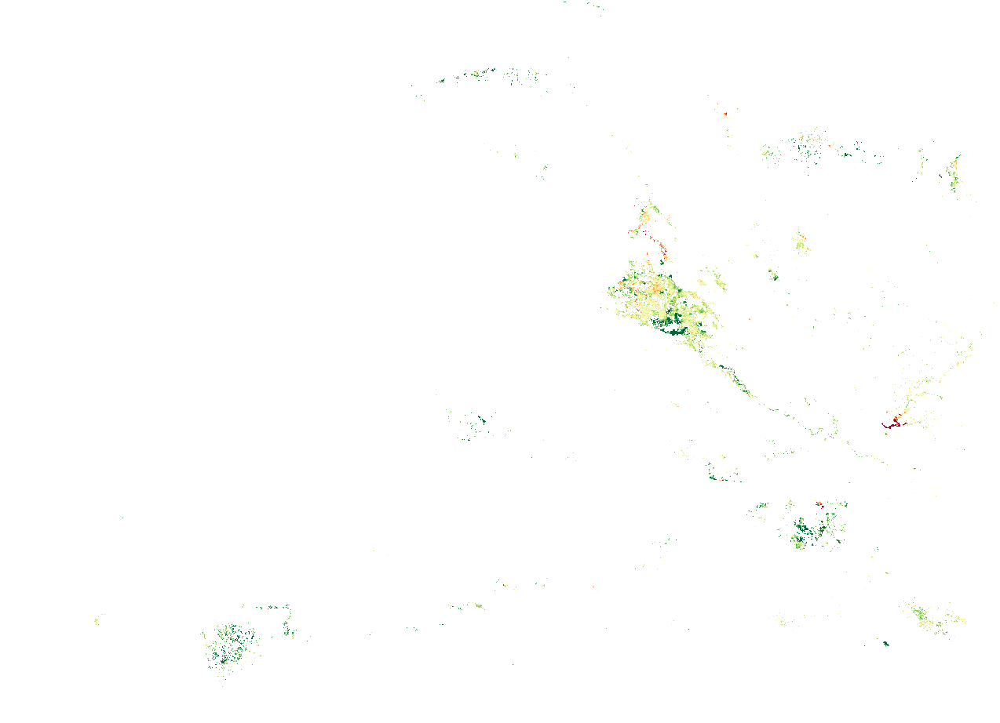

In [63]:
tif_path = "C:/Users/Usuario/Downloads/haiti_EVI_diff_2024.tif"

# Open and read the raster
with rasterio.open(tif_path) as src:
    bounds = src.bounds
    image = src.read(1)
    image = np.ma.masked_equal(image, src.nodata)  # Mask no-data values

    # Normalize for colormap
    norm_img = np.clip((image - (-1000)) / (1000 - (-1000)), 0, 1)

    # Apply red-yellow-green colormap
    colormap = plt.colormaps['RdYlGn']

    rgba_img = colormap(norm_img, bytes=True)  # Shape (H, W, 4)

    # Save image to buffer as PNG
    buf = BytesIO()
    plt.imsave(buf, rgba_img, format='png')
    img_base64 = base64.b64encode(buf.getvalue()).decode('utf-8')

# Create Folium map
fmap = folium.Map(location=[(bounds.top + bounds.bottom) / 2, (bounds.left + bounds.right) / 2], zoom_start=7)

# Add the image as overlay
image_overlay = folium.raster_layers.ImageOverlay(
    image='data:image/png;base64,' + img_base64,
    bounds=[[bounds.bottom, bounds.left], [bounds.top, bounds.right]],
    opacity=0.7,
    name='EVI',
    interactive=True,
    cross_origin=False,
    zindex=1
)
image_overlay.add_to(fmap)

# Add GeoJSON for Haiti
folium.GeoJson(
    hti_adm1,
    style_function=lambda feature: {
        'fillColor': 'gray',
        'color': 'black',
        'weight': 1,
        'dashArray': '5, 5'
    }).add_to(fmap)

# Add colorbar
colorbar = LinearColormap(
    colors=['red', 'yellow', 'green'], 
    vmin=-1000, 
    vmax=1000
).to_step(index=[-1000, -500, 0, 500, 1000])
colorbar.caption = 'EVI Difference (2023) vs (2012–2022)'
colorbar.add_to(fmap)
fmap.save("haiti_evi_difference_2024.html")

fmap

In [24]:
def calculate_percent_difference(shapefile, reference_raster_path, target_raster_path, nodata_value=None):
    """
    Generalized function to calculate the percent difference for EVI between
    a reference period (e.g., 2018-2022) and a target year (e.g., 2023 or 2024).

    Parameters:
    - shapefile: GeoDataFrame containing geometries (e.g., adm1 regions)
    - reference_raster_path: Path to the raster data for the reference period (e.g., 2018-2022)
    - target_raster_path: Path to the raster data for the target year (e.g., 2023 or 2024)
    - nodata_value: Optional; specify the nodata value in the raster (default: None)

    Returns:
    - percent_difference: List of percent difference values for each adm1 region
    """
    
    # Load the raster datasets for the reference period and the target year
    with rasterio.open(reference_raster_path) as ref_src, rasterio.open(target_raster_path) as target_src:
        
        # Ensure the shapefile and the rasters have the same CRS
        if shapefile.crs != ref_src.crs:
            shapefile = shapefile.to_crs(ref_src.crs)
        
        # Initialize lists to store the mean values for the reference and target rasters
        mean_values_reference = []
        mean_values_target = []
        
        # Iterate over each polygon (e.g., adm1 regions) and calculate the mean values
        for _, row in shapefile.iterrows():
            geometry = [row['geometry']]
            
            # Mask and calculate the mean for the reference period
            out_image_reference, _ = mask(ref_src, geometry, crop=True)
            mean_value_reference = np.nanmean(out_image_reference[out_image_reference != nodata_value])
            mean_values_reference.append(mean_value_reference)
            
            # Mask and calculate the mean for the target year
            out_image_target, _ = mask(target_src, geometry, crop=True)
            mean_value_target = np.nanmean(out_image_target[out_image_target != nodata_value])
            mean_values_target.append(mean_value_target)
        
        # Calculate the percent difference between the reference period and the target year for each region
        percent_difference = [
            (v_target - v_reference) / v_reference * 100 if v_reference != 0 else np.nan
            for v_reference, v_target in zip(mean_values_reference, mean_values_target)
        ]
        
        return percent_difference

In [25]:
# Function to create a folium map to show change in evi
def create_percent_change_map(geo_data, column_name, map_title, legend_name, color_palette, output_path):
    """
    Creates a Folium map to visualize percent change data for any metric (EVI, Temperature, Rainfall).
    
    Parameters:
    - geo_data: GeoDataFrame containing the governorate data and percent change values.
    - column_name: Name of the column that contains the percent change values.
    - map_title: Title of the map (e.g., 'EVI Percent Change', 'Temperature Percent Change').
    - legend_name: Name for the legend (e.g., 'Percent Change in EVI (2024 vs 2023)').
    - color_palette: Color palette for the choropleth (e.g., 'YlGnBu').
    - output_path: File path to save the HTML map.
    """
    
    # Initialize the map
    
    m = folium.Map(location=[centy,centx], zoom_start=6, tiles='cartodb positron')

    # Add the choropleth map to the Folium map
    choropleth = folium.Choropleth(
        geo_data=geo_data.to_json(),  # Convert GeoDataFrame to JSON format
        name=map_title,
        data=geo_data,  # GeoDataFrame with merged percent change data
        columns=['shapeName', column_name],  # Columns to use for mapping
        key_on='feature.properties.shapeName',  # Key for the shapefile
        fill_color=color_palette,  # Custom color scheme
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=legend_name
    ).add_to(m)

    # Display governorate names on the map (without hover)
    for idx, row in geo_data.iterrows():
        folium.Marker(
            location=[row.geometry.centroid.y, row.geometry.centroid.x],
            icon=folium.DivIcon(html=f"""<div style="font-size: 9px; font-weight: bold;">{row['shapeName']}</div>""")
        ).add_to(m)

    # Add tooltips to display governorate names and percent change on hover
    folium.GeoJson(
        geo_data.to_json(),
        style_function=lambda x: {'fillColor': '#ffffff', 'color': '#000000', 'fillOpacity': 0.1, 'weight': 0.1},
        highlight_function=lambda x: {'fillColor': '#000000', 'color': '#000000', 'fillOpacity': 0.50, 'weight': 0.1},
        tooltip=folium.GeoJsonTooltip(
            fields=['shapeName', column_name],  # Fields to display
            aliases=['State:', f'Percent Change in {map_title}:'],  # Custom labels for the tooltip
            localize=True,
            labels=True,
            sticky=False,  # Tooltip stays near the mouse
            toLocaleString=True  # Format numbers nicely
        )
    ).add_to(m)

    # Add layer control and save the map
    folium.LayerControl().add_to(m)
    m.save(output_path)
    #print(f"Map saved to {output_path}")

    return m


In [ ]:
# Define the export parameters
evi_2018_2022_task = ee.batch.Export.image.toDrive(
    image=gs_evi_10yr_avg,
    description='GS_EVI_2012_2022_haiti_merged_mean',
    folder='GEE_exports',
    scale=250,  # MODIS scale (250 meters)
    region=haiti_geometry,  # Define region covering Syria
    fileFormat='GeoTIFF'
)

evi_2023_task = ee.batch.Export.image.toDrive(
    image=gs_evi_2023,
    description='GS_EVI_2023_haiti_merged_mean',
    folder='GEE_exports',
    scale=250,  # MODIS scale (250 meters)
    region=haiti_geometry,  # Define region covering Syria
    fileFormat='GeoTIFF'
)

evi_2024_task = ee.batch.Export.image.toDrive(
    image=gs_evi_2024,
    description='GS_EVI_2024_haiti_merged_mean',
    folder='GEE_exports',
    scale=250,  # MODIS scale (250 meters)
    region=haiti_geometry,  # Define region covering Syria
    fileFormat='GeoTIFF'
)

evi_2018_2022_task.start()
evi_2023_task.start()
evi_2024_task.start()

In [22]:
# Load the EVI GeoTIFF file (downloaded from GEE)
evi_2012_2022_path = "C:/Users/Usuario/Downloads/GS_EVI_2012_2022_haiti_merged_mean.tif"
evi_2023_path = "C:/Users/Usuario/Downloads/GS_EVI_2023_haiti_merged_mean.tif"
evi_2024_path = "C:/Users/Usuario/Downloads/GS_EVI_2024_haiti_merged_mean.tif"
#read geotiff files
evi_2018_2022_data = rasterio.open(evi_2012_2022_path)
evi_2023_data = rasterio.open(evi_2023_path)
evi_2024_data = rasterio.open(evi_2024_path)

In [26]:
# calculate percent change in evi for full year of 2022 and 2023
percent_change_evi_ref_23 = calculate_percent_difference(hti_adm1, evi_2012_2022_path, evi_2023_path, nodata_value=None)
#print(percent_change_evi_2023_24)
hti_adm1['Percent_Change_evi_ref_23'] = percent_change_evi_ref_23

# calculate percent change in evi for first 8 months of 2023 and 2024
percent_change_evi_ref_24 = calculate_percent_difference(hti_adm1, evi_2012_2022_path, evi_2024_path, nodata_value=None)
#print(percent_change_evi_2023_24)
hti_adm1['Percent_Change_evi_ref_24'] = percent_change_evi_ref_24

### EVI change - Adm1 Level [2023]

In [27]:
#create a folium map to show percent change in EVI for full year 2022 vs 2023
create_percent_change_map(
    geo_data=hti_adm1,                  
    column_name='Percent_Change_evi_ref_23',     
    map_title='EVI Percent Change', # Title for the map
    legend_name='Percent Change in EVI (Ref vs 2023)',  # Legend name
    color_palette='RdYlGn',                 # Color palette (Red-Yellow-Blue is often used for temperature maps)
    output_path='haiti_EVI_refvs2023_map.html'  # Output HTML file for the map
)

#### EVI Change - Adm1 Level [2024]

In [28]:
#create a folium map to show percent change in EVI for full year 2022 vs 2023
create_percent_change_map(
    geo_data=hti_adm1,                  # GeoDataFrame with governorates and temperature percent change
    column_name='Percent_Change_evi_ref_24',      # Column with percent change in temperature
    map_title='EVI Percent Change', # Title for the map
    legend_name='Percent Change in EVI (ref vs 2024)',  # Legend name
    color_palette='RdYlGn',                 # Color palette (Red-Yellow-Blue is often used for temperature maps)
    output_path='haiti_EVI_refvs2024_map.html'  # Output HTML file for the map
)

In [29]:
def extract_evi_values_per_state(shapefile, reference_raster_path, target_raster_path_2023, target_raster_path_2024, nodata_value=None):
    """
    Function to extract the mean EVI for each state (State_En) from raster files 
    for the reference period (2018-2022), and for the years 2023 and 2024.

    Parameters:
    - shapefile: GeoDataFrame containing the adm1 regions with 'State_En' as the state name column.
    - reference_raster_path: Path to the raster data for the reference period (e.g., 2018-2022).
    - target_raster_path_2023: Path to the raster data for the year 2023.
    - target_raster_path_2024: Path to the raster data for the year 2024.
    - nodata_value: Optional; specify the nodata value in the raster (default: None).

    Returns:
    - evi_2018_2022_mean: Dictionary of mean EVI values for 2018-2022 for each state.
    - evi_2023_mean: Dictionary of mean EVI values for 2023 for each state.
    - evi_2024_mean: Dictionary of mean EVI values for 2024 for each state.
    """
    
    # Load the raster datasets for the reference period, 2023, and 2024
    with rasterio.open(reference_raster_path) as ref_src, \
         rasterio.open(target_raster_path_2023) as src_2023, \
         rasterio.open(target_raster_path_2024) as src_2024:
        
        # Ensure the shapefile and the rasters have the same CRS
        if shapefile.crs != ref_src.crs:
            shapefile = shapefile.to_crs(ref_src.crs)
        
        # Initialize dictionaries to store mean EVI values for each state
        evi_2018_2022_mean = {}
        evi_2023_mean = {}
        evi_2024_mean = {}
        
        # Iterate over each polygon (e.g., adm1 regions) and extract the mean values
        for _, row in shapefile.iterrows():
            state_name = row['shapeName']  # Column with state name
            geometry = [row['geometry']]
            
            # Extract the mean value for the reference period (2018-2022)
            out_image_reference, _ = mask(ref_src, geometry, crop=True)
            masked_data_reference = out_image_reference[out_image_reference != nodata_value]
            if masked_data_reference.size > 0:
                mean_value_reference = np.nanmean(masked_data_reference)
            else:
                mean_value_reference = np.nan  # No valid data found
            evi_2018_2022_mean[state_name] = mean_value_reference
            
            # Extract the mean value for 2023
            out_image_2023, _ = mask(src_2023, geometry, crop=True)
            masked_data_2023 = out_image_2023[out_image_2023 != nodata_value]
            if masked_data_2023.size > 0:
                mean_value_2023 = np.nanmean(masked_data_2023)
            else:
                mean_value_2023 = np.nan  # No valid data found
            evi_2023_mean[state_name] = mean_value_2023
            
            # Extract the mean value for 2024
            out_image_2024, _ = mask(src_2024, geometry, crop=True)
            masked_data_2024 = out_image_2024[out_image_2024 != nodata_value]
            if masked_data_2024.size > 0:
                mean_value_2024 = np.nanmean(masked_data_2024)
            else:
                mean_value_2024 = np.nan  # No valid data found
            evi_2024_mean[state_name] = mean_value_2024
        
        # Return the dictionaries containing the mean values for each state
        return evi_2018_2022_mean, evi_2023_mean, evi_2024_mean

In [49]:
#sdn_adm1.to_file("C:\\Users\\ishaa\\OneDrive\\Desktop\\DataLab\\Sudan\\sudan-poverty-monitoring\\data\\sdn_adm1_evi_changes.shp", driver="ESRI Shapefile")

In [30]:
extract_mean_2018_2022 , extract_2023_mean, extract_2024_mean = extract_evi_values_per_state(
    shapefile=hti_adm1,
    reference_raster_path=evi_2012_2022_path,  # Path to the EVI raster file for 2012-2022
    target_raster_path_2023=evi_2023_path,     # Path to the EVI raster file for 2023
    target_raster_path_2024=evi_2024_path,     # Path to the EVI raster file for 2024
    nodata_value=np.nan)                                  # Specify the nodata value in the raster files (if applicable)

In [31]:
hti_adm1_df = hti_adm1.set_index('shapeName')

In [32]:
hti_adm1_df['evi_2012_2022_mean'] =  extract_mean_2018_2022
hti_adm1_df['evi_2023_mean'] =  extract_2023_mean
hti_adm1_df['evi_2024_mean'] =  extract_2024_mean

#### EVI Changes Across Haiti States Over Time

::::{tab-set}

:::{tab-item} 2023-2024
![EVI_change_bar_haiti_2023_24.png](../../docs/images/agriculture/EVI_change_bar_haiti_2023_24.png)
:::
::::

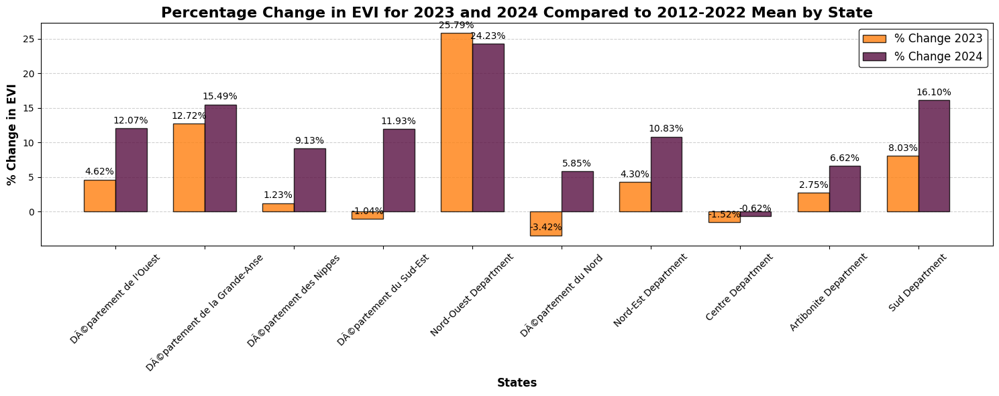

In [ ]:
def plot_evi_percentage_change(geo_data):
    """
    Plots the percentage change in EVI for 2023 and 2024 compared to the mean EVI from 2012-2022
    for each state in Haiti (adm1 level).

    Parameters:
    - geo_data: GeoDataFrame containing the Haiti adm1 boundaries and EVI data.
                It should have 'evi_2012_2022_mean', 'evi_2023_mean', and 'evi_2024_mean' columns,
                and 'shapeName' as the index.
    """
    
    # Get the unique states (index of the DataFrame)
    states = geo_data.index.unique()
    
    # Prepare data for plotting
    evi_2012_2022 = geo_data['evi_2012_2022_mean']
    evi_2023 = geo_data['evi_2023_mean']
    evi_2024 = geo_data['evi_2024_mean']
    
    # Calculate percentage change for 2023 and 2024
    pct_change_2023 = ((evi_2023 - evi_2012_2022) / evi_2012_2022) * 100
    pct_change_2024 = ((evi_2024 - evi_2012_2022) / evi_2012_2022) * 100
    
    # Set up the plot
    fig, ax = plt.subplots(figsize=(15, len(states) * 0.6))
    bar_width = 0.35
    index = np.arange(len(states))
    
    # Plot bar chart for the percentage change in 2023 and 2024
    bar1 = ax.bar(index, pct_change_2023, bar_width, label='% Change 2023', color='#ff7f0e', alpha=0.8, edgecolor='black')
    bar2 = ax.bar(index + bar_width, pct_change_2024, bar_width, label='% Change 2024', color='#580F41', alpha=0.8, edgecolor='black')
    
    # Add value labels to the bars
    def add_value_labels(bars):
        for bar in bars:
            height = bar.get_height()
            ax.annotate(f'{height:.2f}%',
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom', fontsize=10, color='black')

    add_value_labels(bar1)
    add_value_labels(bar2)

    # Formatting the plot
    ax.set_xlabel('States', fontsize=12, fontweight='bold')
    ax.set_ylabel('% Change in EVI', fontsize=12, fontweight='bold')
    ax.set_title('Percentage Change in EVI for 2023 and 2024 Compared to 2012-2022 Mean by State', fontsize=16, fontweight='bold')
    ax.set_xticks(index + bar_width / 2)
    ax.set_xticklabels(states, rotation=45, fontsize=10)
    ax.legend(fontsize=12, loc='upper right', frameon=True, facecolor='white', edgecolor='black')
    
    # Adding grid and adjusting layout
    ax.grid(True, linestyle='--', alpha=0.6, axis='y')
    ax.set_axisbelow(True)  # Ensure the grid is behind the bars
    plt.tight_layout()
    plt.show()

# Example usage with sdn_adm1_df, where 'shapeName' is the index
plot_evi_percentage_change(hti_adm1_df)


## Part 2: Calculating Z-Score Anomalies in EVI for Detecting No-Planting Pixels

The second part of the analysis aims to detect no-planting pixels using z-score anomalies in EVI and to calculate the extent of these areas within each Admin1 boundary. The methodology includes the following steps:

1. **Calculating Z-Score Anomalies for EVI**:
   - For each pixel, the z-score is calculated based on the EVI values for 2023 and 2024 relative to the mean and standard deviation of the previous ten years (2012-2022). This standardizes the data and highlights deviations from normal productivity.
   - Pixels with z-scores below a certain threshold (in this case, below 2 negative standard deviations)  are classified as "no-planting" pixels, indicating a significant reduction in vegetation cover.

2. **Summing No-Planting Pixel Areas**:
   - The areas of no-planting pixels are calculated by multiplying the number of detected pixels by the pixel area (in hectares).
   - These areas are aggregated per Admin1 boundary to estimate the total extent of no-planting regions.

3. **Calculating Total Cropland and Percent No-Planting Areas**:
   - The total cropland area for each Admin1 region is calculated and the percentage of no-planting areas is calculated by against the total cropland area within each Admin1 boundary.
   
4. **Visualizing Results**:
   - Maps are generated to show the spatial distribution of no-planting areas and the percentage of total cropland affected.


Together, these methodologies provide a comprehensive approach to analyzing changes in agricultural productivity and identifying areas of concern at the regional level.

In [34]:
#  Calculating the standard deviation for the growing season evi over the years 2012-2022
gs_evi_2012_2022_std = mxd13q1.filterDate('2012-01-01', '2022-12-31').filter(growing_season).reduce(ee.Reducer.stdDev()).clip(haiti_geometry)

In [ ]:
# # Calculate z-scores for the 2023 EVI values
# z_score = gs_evi_2023.subtract(gs_evi_10yr_avg).divide(gs_evi_2012_2022_std).rename('EVI_Z_Score_2023')

# # Set a z-score threshold (e.g., -2 for significant negative deviations)
# z_score_threshold = -2

# # Identify areas where the z-score is below the threshold (significant negative anomaly)
# no_planting_2023 = z_score.lt(z_score_threshold).selfMask()

# # Step 5: Calculate the total area
# pixel_area = ee.Image.pixelArea()
# no_planting_area_2023 = no_planting_2023.multiply(pixel_area).reduceRegion(
#     reducer=ee.Reducer.sum(),
#     geometry=haiti_geometry,
#     scale=500,
#     maxPixels=1e13
# )

# # Print the total area with no observed plantings for 2023
# total_area_sq_m =  no_planting_area_2023.getInfo()['EVI_Z_Score_2023']
# total_area_hectares = total_area_sq_m / 10000
# print('Total cropland area with no observed plantings for 2023:',total_area_hectares)


EEException: User memory limit exceeded.

In [ ]:
# Calculate z-scores for the 2024 EVI values
# z_score_2024 = gs_evi_2024.subtract(gs_evi_10yr_avg).divide(gs_evi_2012_2022_std).rename('EVI_Z_Score_2024')

# # Set a z-score threshold (e.g., -2 for significant negative deviations)
# z_score_threshold = -2

# # Identify areas where the z-score is below the threshold (significant negative anomaly)
# no_planting_2024 = z_score_2024.lt(z_score_threshold).selfMask()

# # Step 5: Calculate the total area
# pixel_area = ee.Image.pixelArea()
# no_planting_area_2024 = no_planting_2024.multiply(pixel_area).reduceRegion(
#     reducer=ee.Reducer.sum(),
#     geometry=haiti_geometry,
#     scale=500,
#     maxPixels=1e13
# )

# # Print the total area with no observed plantings for 2023
# total_area_sq_m =  no_planting_area_2024.getInfo()['EVI_Z_Score_2024']
# total_area_hectares = total_area_sq_m / 10000
# print('Total cropland area with no observed plantings for 2024:',total_area_hectares)


EEException: User memory limit exceeded.

In [ ]:
# Calculate z-scores for the 2024 EVI values
z_score_2024 = gs_evi_2024.subtract(gs_evi_10yr_avg).divide(gs_evi_2012_2022_std).rename('EVI_Z_Score_2024')

z_score_2024_by_admin1 = z_score_2024.reduceRegions(
    collection=aoi1,
    reducer=ee.Reducer.mean(),
    scale=500,
    crs='EPSG:4326'
)

# Step 4: Export the result to Google Drive as a CSV
task = ee.batch.Export.table.toDrive(
    collection=z_score_2024_by_admin1.select(['shapeName', 'mean']),  # Replace 'shapeName' with the name of your admin1 property
    description='Z_Score_By_Admin1_Export_2024',
    fileFormat='CSV',
    fileNamePrefix='EVI_Z_Score_By_Admin1_2024'
)

# Start the export task
task.start()
print("Exporting mean z-score by admin1 region as CSV to Google Drive.")

Exporting mean z-score by admin1 region as CSV to Google Drive.


In [40]:
evi_diff_2023_adm1 = evi_diff_2023.reduceRegions(
    collection=aoi1,
    reducer=ee.Reducer.mean(),
    scale=500,
    crs='EPSG:4326'
)

# Step 4: Export the result to Google Drive as a CSV
task = ee.batch.Export.table.toDrive(
    collection=evi_diff_2023_adm1.select(['shapeName', 'mean']),  # Replace 'shapeName' with the name of your admin1 property
    description='EVI_diff_Admin1_Export_2023',
    fileFormat='CSV',
    fileNamePrefix='EVI_diff_Admin1_Export_2023'
)

# Start the export task
task.start()
print("Exporting mean evi diff by admin1 region as CSV to Google Drive.")

Exporting mean evi diff by admin1 region as CSV to Google Drive.


In [ ]:
'''evi_diff_2024_adm1 = evi_diff_2024.reduceRegions(
    collection=aoi1,
    reducer=ee.Reducer.mean(),
    scale=500,
    crs='EPSG:4326'
)

# Step 4: Export the result to Google Drive as a CSV
task = ee.batch.Export.table.toDrive(
    collection=evi_diff_2024_adm1.select(['State_En', 'mean']),  # Replace 'State_En' with the name of your admin1 property
    description='EVI_diff_Admin1_Export_2024',
    fileFormat='CSV',
    fileNamePrefix='EVI_diff_Admin1_Export_2024'
)

# Start the export task
task.start()
print("Exporting mean evi diff by admin1 region as CSV to Google Drive.")'''

#### No planting area statistics: 2023

In [36]:
import importlib
import calculate_areas
importlib.reload(calculate_areas)

# # Calculate z-scores for the 2023 EVI values
z_score = gs_evi_2023.subtract(gs_evi_10yr_avg).divide(gs_evi_2012_2022_std).rename('EVI_Z_Score_2023')

# Set a z-score threshold (e.g., -2 for significant negative deviations)
z_score_threshold = -2

# Identify areas where the z-score is below the threshold (significant negative anomaly)
no_planting_2023 = z_score.lt(z_score_threshold).selfMask()

# Call the function and pass the required variables
sdn_adm_no_planting_2023 = calculate_areas.process_sdn_adm1(hti_adm1, no_planting_2023, gs_evi_2023, 2023)

# Display the result
#print((sdn_adm1[['State_En', 'No_Planting_Area_ha', 'Total_Cropland_Area_ha', 'Percent_No_Planting']]))

sdn_adm_no_planting_2023[['shapeName', 'No_Planting_Area_ha', 'Total_Cropland_Area_ha', 'Percent_No_Planting']]

EEException: User memory limit exceeded.

In [ ]:
# Create a base map centered on Haiti
m = folium.Map(location=[15.5, 32.5], zoom_start=6)

# Add the GeoDataFrame to the map
folium.Choropleth(
    geo_data=hti_adm1,
    name='No Planting Area',
    data=hti_adm1,
    columns=['State_En', 'Percent_No_Planting'],
    key_on='feature.properties.State_En',
    fill_color='PuOr',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Percentage of No Planting Area'
).add_to(m)

# Add tooltips
for _, row in hti_adm1.iterrows():
    folium.Marker(
        location=[row.geometry.centroid.y, row.geometry.centroid.x],
        icon=folium.DivIcon(html=f"""<div style="font-size: 9px; font-weight: bold;">
                                    {row['State_En']}: {row['Percent_No_Planting']:.2f}%</div>""")
    ).add_to(m)

# Save the map to an HTML file
m.save('no_planting_area_map-2023.html')

m


#### No planting area statistics: 2024

In [ ]:
import importlib
import calculate_areas
importlib.reload(calculate_areas)

# Calculate z-scores for the 2024 EVI values
z_score_2024 = gs_evi_2024.subtract(gs_evi_10yr_avg).divide(gs_evi_2012_2022_std).rename('EVI_Z_Score_2024')

# Set a z-score threshold (e.g., -2 for significant negative deviations)
z_score_threshold = -2

# Identify areas where the z-score is below the threshold (significant negative anomaly)
no_planting_2024 = z_score_2024.lt(z_score_threshold).selfMask()

# Call the function and pass the required variables
sdn_adm_no_planting_2024 = calculate_areas.process_sdn_adm1(hti_adm1, no_planting_2024, gs_evi_2024, 2024)

# Display the result
#print((sdn_adm1[['State_En', 'No_Planting_Area_ha', 'Total_Cropland_Area_ha', 'Percent_No_Planting']]))

sdn_adm_no_planting_2024[['State_En', 'No_Planting_Area_ha', 'Total_Cropland_Area_ha', 'Percent_No_Planting']]

EEException: User memory limit exceeded.

In [ ]:
# Create a base map centered on Haiti
m = folium.Map(location=[15.5, 32.5], zoom_start=6)

# Add the GeoDataFrame to the map
folium.Choropleth(
    geo_data=hti_adm1,
    name='No Planting Area',
    data=hti_adm1,
    columns=['shapeName', 'Percent_No_Planting'],
    key_on='feature.properties.shapeName',
    fill_color='PuOr',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Percentage of No Planting Area'
).add_to(m)

# Add tooltips
for _, row in hti_adm1.iterrows():
    folium.Marker(
        location=[row.geometry.centroid.y, row.geometry.centroid.x],
        icon=folium.DivIcon(html=f"""<div style="font-size: 9px; font-weight: bold;">
                                    {row['shapeName']}: {row['Percent_No_Planting']:.2f}%</div>""")
    ).add_to(m)

# Save the map to an HTML file
m.save('no_planting_area_map_2024.html')

m


In [38]:
baseline_period = mxd13q1.filterDate('2012-01-01','2024-12-31')

# Define a function to calculate monthly mean EVI values
def monthly_mean_evi(year, month):
    # Filter images for the specific month and year
    start_date = ee.Date.fromYMD(year, month, 1)
    end_date = start_date.advance(1, 'month')
    #print(end_date)
    monthly_images = baseline_period.filterDate(start_date, end_date)

    #Calculate the mean of the monthly images
    mean_image = monthly_images.mean()

    # Print band names of the mean image
    print("Band names of the mean EVI image:", mean_image.bandNames().getInfo())


    # Calculate the mean EVI for the month
    mean_evi = mean_image.reduceRegion(
        reducer=ee.Reducer.mean(),
        geometry=haiti_geometry,
        scale=250,
        maxPixels=1e9
    )
    return ee.Feature(None, {
        'year': year,
        'month': month,
        'mean_evi': mean_evi.get('EVI')
    })

In [52]:
# Loop through each month in the baseline period to create a time series
features = []
for year in range(2012, 2025):  # 2012 to 2024 inclusive
    for month in range(1, 13):  # January to December
        features.append(monthly_mean_evi(year, month))

# Convert to a FeatureCollection
monthly_evi_collection = ee.FeatureCollection(features)

Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: ['EVI']
Band names of the mean EVI image: 

In [53]:
# Export the EVI time series to Google Drive as CSV
task = ee.batch.Export.table.toDrive(
    collection=monthly_evi_collection,
    description='monthly_EVI_Haiti_2012_2024',
    fileFormat='CSV'
)
task.start()
print("Export task started. Check Google Drive for the exported CSV file.")

Export task started. Check Google Drive for the exported CSV file.


In [54]:
monthly_evi_2012_2024 = pd.read_csv("C:/Users/Usuario/Downloads/monthly_EVI_Haiti_2012_2024.csv")
monthly_evi_2012_2024 = monthly_evi_2012_2024.drop(columns = ['system:index','.geo'])
monthly_evi_2012_2024

,mean_evi,month,year
0,3105.276208,1,2012
1,3081.605159,2,2012
2,3091.672467,3,2012
3,3540.660944,4,2012
4,3720.856204,5,2012
...,...,...,...
151,4493.323635,8,2024
152,4543.765790,9,2024
153,4153.093792,10,2024
154,3940.133185,11,2024


### Plotting monthly cycles of EVI over Haiti across time

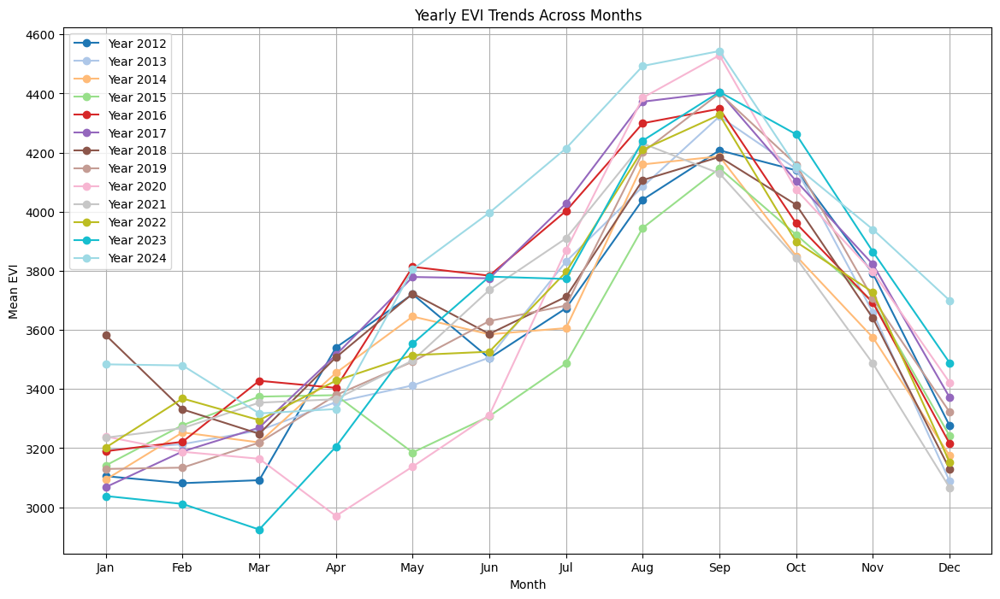

In [55]:
# Plot individual line graphs for each year across all months

#monthly_evi_2018_2023 = monthly_evi_2012_2024[(monthly_evi_2012_2024['year'] >= 2018) & (monthly_evi_2012_2024['year'] < 2025)]

colors = plt.colormaps['tab20'].resampled(13)

plt.figure(figsize=(14, 8))
for idx, year in enumerate(monthly_evi_2012_2024['year'].unique()):
    yearly_data = monthly_evi_2012_2024[monthly_evi_2012_2024['year'] == year]
    plt.plot(yearly_data['month'], yearly_data['mean_evi'], marker='o', linestyle='-', label=f'Year {year}', color=colors(idx))

plt.title('Yearly EVI Trends Across Months')
plt.xlabel('Month')
plt.ylabel('Mean EVI')
plt.xticks(np.arange(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.grid(True)
plt.show()


In [56]:
# Filter data for the growing season (June to October)
growing_season_df = monthly_evi_2012_2024[(monthly_evi_2012_2024['month'] >= 6) & (monthly_evi_2012_2024['month'] <= 10)]

# Group by year and calculate the mean EVI for the growing season
growing_season_mean = growing_season_df.groupby('year')['mean_evi'].mean().reset_index()

### Plotting yearly trends in EVI Mean values over Haiti

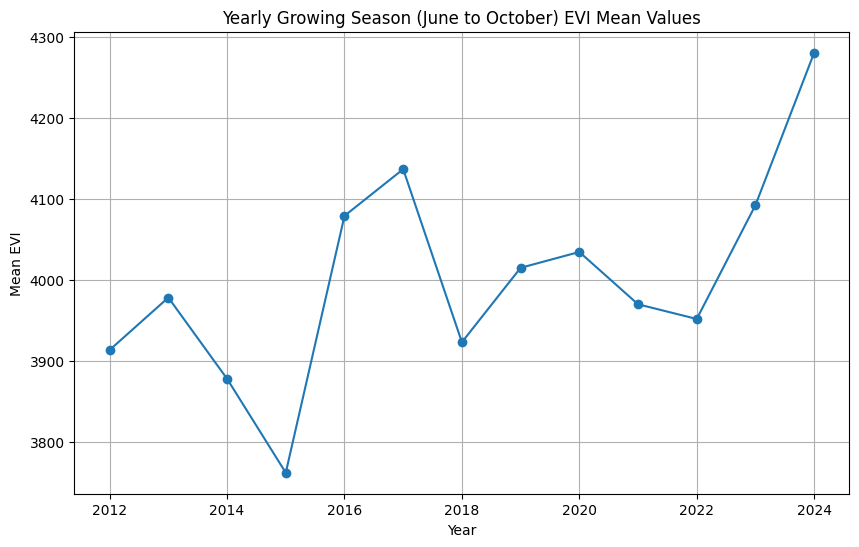

In [57]:
# Plot the line graph
plt.figure(figsize=(10, 6))
plt.plot(growing_season_mean['year'], growing_season_mean['mean_evi'], marker='o', linestyle='-')
plt.title('Yearly Growing Season (June to October) EVI Mean Values')
plt.xlabel('Year')
plt.ylabel('Mean EVI')
plt.grid(True)
plt.show()

### Comparing Precipitation across Years

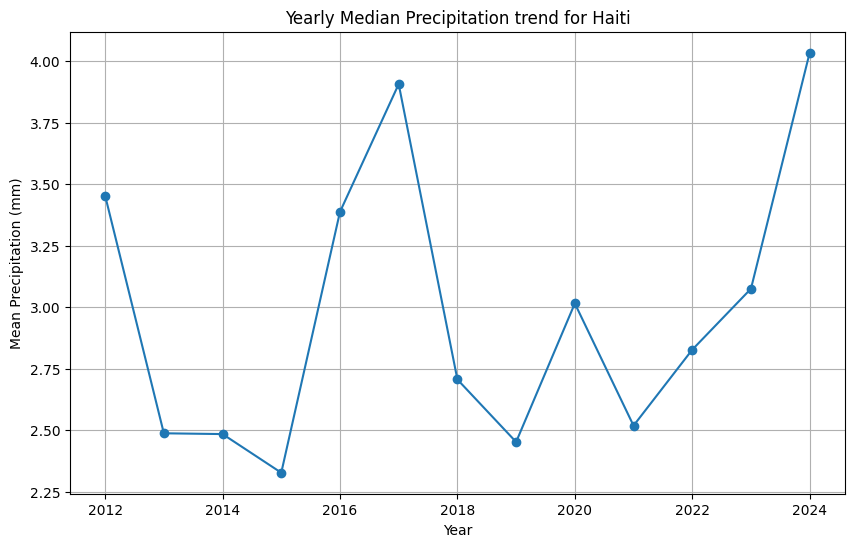

In [10]:
# Load CHIRPS dataset
chirps = ee.ImageCollection("UCSB-CHG/CHIRPS/DAILY")

# Filter dataset to the region of Haiti and select precipitation values from 2000 to 2024
haiti_chirps = chirps.filterBounds(haiti_geometry).filterDate('2012-01-01', '2024-12-31')

# Calculate yearly mean precipitation
def calculate_yearly_mean(year):
    start_date = ee.Date.fromYMD(year, 1, 1)
    end_date = start_date.advance(1, 'year')
    yearly_data = haiti_chirps.filterDate(start_date, end_date)
    return yearly_data.mean().set('year', year)

# Generate list of yearly mean images
years = list(range(2012, 2025))
yearly_precip = [calculate_yearly_mean(year) for year in years]

# Create an ImageCollection from the yearly mean images
yearly_precip_collection = ee.ImageCollection.fromImages(yearly_precip)

# Extract precipitation values to a list
mean_precipitation = []
for year in years:
    image = yearly_precip_collection.filter(ee.Filter.eq('year', year)).first()
    mean_value = image.reduceRegion(
        reducer=ee.Reducer.median(),
        geometry=haiti_geometry,
        scale=5000,
        maxPixels=1e9
    ).get('precipitation').getInfo()
    mean_precipitation.append(mean_value)

# Plotting the mean precipitation values over years
plt.figure(figsize=(10, 6))
plt.plot(years, mean_precipitation, marker='o')
plt.xlabel("Year")
plt.ylabel("Mean Precipitation (mm)")
plt.title("Yearly Median Precipitation trend for Haiti")
plt.grid(True)
plt.show()


In [59]:
# Select the top N rows with the highest values in 'column_name'
top_n = 5  # Change this to the number of top rows you want
top_evi_admin1 = hti_adm1_df.nlargest(top_n, 'evi_2012_2022_mean')

In [61]:
top_state_list = top_evi_admin1.index.tolist()
print(top_state_list)

['Artibonite Department', 'Nord-Est Department', 'Centre Department', 'Sud Department', "DÃ©partement de l'Ouest"]


In [ ]:
# Define a function to compute mean EVI for a given year   (this function is not used in the code)
# def get_mean_evi(year):
#     start_date = f"{year}-01-01"
#     end_date = f"{year}-12-31"
#     evi_image = mxd13q1.filterDate(start_date, end_date).mean()
#     evi_stats = evi_image.reduceRegions(
#         collection=aoi1,
#         reducer=ee.Reducer.mean(),
#         scale=500
#     )
#     evi_stats = evi_stats.map(lambda f: f.set("year", year))
#     return evi_stats

In [63]:
# Define a function to compute mean EVI for the growing season (June 1st to August 31st) for a given year
def get_mean_evi2(year):
    start_date = f"{year}-06-01"
    end_date = f"{year}-08-31"
    evi_image = mxd13q1.filterDate(start_date, end_date).mean()
    evi_stats = evi_image.reduceRegions(
        collection=aoi1,
        reducer=ee.Reducer.mean(),
        scale=500
    )
    evi_stats = evi_stats.map(lambda f: f.set("year", year))
    return evi_stats


In [68]:
evi_data = []

for year in years:
    evi_yearly = get_mean_evi2(year).getInfo()
    for feature in evi_yearly["features"]:
        props = feature["properties"]
        if "mean" in props:
            evi_data.append({
                "ADM1": props.get("shapeName", "Unknown"),
                "Year": year,
                "Mean_EVI": props["mean"]
            })
        else:
            print(f"Skipping feature without 'mean' for year {year}: {props}")


Skipping feature without 'mean' for year 2012: {'Percent_Change_evi_ref_23': 12.719838386315944, 'Percent_Change_evi_ref_24': 15.48914200644203, 'shapeGroup': 'HTI', 'shapeID': '49955354B57760347032633', 'shapeISO': 'HT-GA', 'shapeName': 'DÃ©partement de la Grande-Anse', 'shapeType': 'ADM1', 'year': 2012}
Skipping feature without 'mean' for year 2013: {'Percent_Change_evi_ref_23': 12.719838386315944, 'Percent_Change_evi_ref_24': 15.48914200644203, 'shapeGroup': 'HTI', 'shapeID': '49955354B57760347032633', 'shapeISO': 'HT-GA', 'shapeName': 'DÃ©partement de la Grande-Anse', 'shapeType': 'ADM1', 'year': 2013}
Skipping feature without 'mean' for year 2014: {'Percent_Change_evi_ref_23': 12.719838386315944, 'Percent_Change_evi_ref_24': 15.48914200644203, 'shapeGroup': 'HTI', 'shapeID': '49955354B57760347032633', 'shapeISO': 'HT-GA', 'shapeName': 'DÃ©partement de la Grande-Anse', 'shapeType': 'ADM1', 'year': 2014}
Skipping feature without 'mean' for year 2015: {'Percent_Change_evi_ref_23': 12

In [ ]:
# Retrieve EVI and Rainfall data for each year and store in lists
# evi_data1 = []

# for year in years:
#     evi_yearly = get_mean_evi(year).getInfo()
#     for feature in evi_yearly["features"]:
#         evi_data1.append({
#             "ADM1": feature["properties"]["shapeName"],  # Change "ADM2" to the relevant property name
#             "Year": year,
#             "Mean_EVI": feature["properties"]["mean"]
#         })

# evi_df_yearly = pd.DataFrame(evi_data1)

In [ ]:
# # Retrieve EVI and Rainfall data for each year and store in lists
# evi_data = []

# for year in years:
#     evi_yearly = get_mean_evi2(year).getInfo()
#     for feature in evi_yearly["features"]:
#         evi_data.append({
#             "ADM1": feature["properties"]["shapeName"],  # Change "ADM2" to the relevant property name
#             "Year": year,
#             "Mean_EVI": feature["properties"]["mean"]
#         })

In [69]:
evi_df_gs = pd.DataFrame(evi_data)

In [70]:
evi_df_gs_wide = evi_df_gs.pivot(index='Year', columns='ADM1', values='Mean_EVI')
evi_df_gs_wide

ADM1,Artibonite Department,Centre Department,DÃ©partement de l'Ouest,DÃ©partement des Nippes,DÃ©partement du Nord,DÃ©partement du Sud-Est,Nord-Est Department,Nord-Ouest Department,Sud Department
Year,,,,,,,,,
2012,3781.315090,3459.445461,3589.275156,3989.064019,3901.622917,3825.994220,4019.566925,2880.473577,4158.587146
2013,3836.104650,3321.550385,3756.880177,4214.073568,4260.139583,3685.681258,4551.606569,2679.689486,3993.233689
2014,3862.757896,3991.049756,3468.053737,4346.308702,3993.351042,3543.516074,4244.242204,2677.394709,3697.977287
2015,3701.206851,4075.087430,3417.349009,4018.483073,3769.888542,2753.789060,4161.653563,1913.108153,2952.849547
2016,4010.701230,4060.867506,4061.134690,4843.627713,4179.157292,3948.546339,4644.606308,2765.566299,4118.087420
2017,4044.995865,4073.296922,3970.413760,4452.824002,4308.320833,3575.488807,4597.050326,3580.383835,4154.466277
2018,3970.509939,3869.635751,3381.940403,4624.615885,3537.442708,3587.232077,3780.864850,3107.192244,3871.196044
2019,3854.943576,3388.428956,4131.857721,5052.765842,4168.887500,3558.441402,4340.730614,2347.012199,3783.913579
2020,3871.769812,4089.874569,3927.021247,4655.522057,3979.625663,3437.896029,3783.535107,2491.059405,3911.968557


In [71]:
evi_df_gs_wide.to_csv('haiti_evi_gs_adm1.csv')

In [ ]:
# evi_wide_df2 = evi_df_yearly.pivot(index='Year', columns='ADM1', values='Mean_EVI')
# evi_wide_df2
# evi_wide_df2.to_csv('haiti_evi_admin1_yearly.csv')

In [74]:
highest_admin1_df = evi_df_gs_wide[top_state_list]
highest_admin1_df

ADM1,Artibonite Department,Nord-Est Department,Centre Department,Sud Department,DÃ©partement de l'Ouest
Year,,,,,
2012,3781.315090,4019.566925,3459.445461,4158.587146,3589.275156
2013,3836.104650,4551.606569,3321.550385,3993.233689,3756.880177
2014,3862.757896,4244.242204,3991.049756,3697.977287,3468.053737
2015,3701.206851,4161.653563,4075.087430,2952.849547,3417.349009
2016,4010.701230,4644.606308,4060.867506,4118.087420,4061.134690
2017,4044.995865,4597.050326,4073.296922,4154.466277,3970.413760
2018,3970.509939,3780.864850,3869.635751,3871.196044,3381.940403
2019,3854.943576,4340.730614,3388.428956,3783.913579,4131.857721
2020,3871.769812,3783.535107,4089.874569,3911.968557,3927.021247


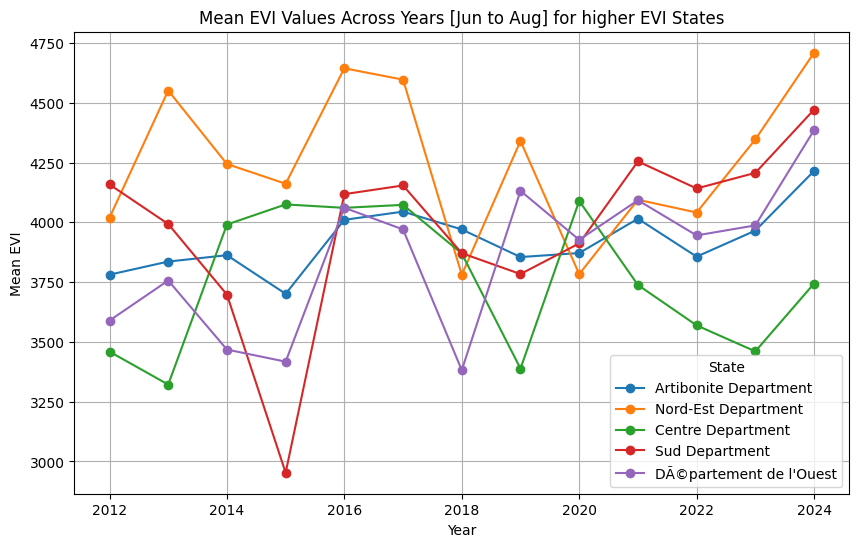

In [ ]:
#### Plotting yearly EVI trends in states with higher EVI values

highest_admin1_df.plot(figsize=(10, 6), marker='o')
plt.xlabel("Year")
plt.ylabel("Mean EVI")
plt.title("Mean EVI Values Across Years [Jun to Aug] for higher EVI States")
plt.legend(title='State')
plt.grid(True)
plt.show()